In [1]:
import rdkit
from rdkit import Chem
from rdkit.Chem import Draw, PandasTools, AllChem

import mordred
from mordred import Calculator, descriptors
import pandas as pd
import numpy as np
import random
import os
import warnings
warnings.filterwarnings("ignore")

SEED = 42
TARGET_COL =  "measured log(solubility:mol/L)"

def set_seed(seed: int = SEED) -> None:
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)

set_seed()

df = pd.read_csv(r'C:\Users\pc\Desktop\project\tutorial_rdkit\models_prediction_solubulity\delaney.csv')
print(df.head())
print(f"Nombre de lignes de départ: {len(df)}")

mol_list = []
valid_idx = []


for i, smi in enumerate(df["SMILES"]):
    m = Chem.MolFromSmiles(smi)
    if m is None:
        print(f"SMILES invalide ignoré (ligne {i}): {smi}")
        continue

    m = Chem.AddHs(m)
    embed_status = AllChem.EmbedMolecule(
        m, randomSeed=SEED, useRandomCoords=True, maxAttempts=50
    )
    if embed_status != 0:
        print(f"Embedding 3D échoué (ligne {i}), molécule ignorée: {smi}")
        continue

    try:
        AllChem.MMFFOptimizeMolecule(m, maxIters=200)
    except Exception as e:
        print(f"Optimisation MMFF échouée (ligne {i}): {e}")

    mol_list.append(m)
    valid_idx.append(i)

print(f"Molécules valides conservées: {len(mol_list)} / {len(df)}")

df_1 = df.iloc[valid_idx].reset_index(drop=True).copy()
df_1["Mol"] = mol_list

calc = Calculator(descriptors, ignore_3D=False)
features_3d = calc.pandas(df_1['Mol'])
features_3d = features_3d.reset_index(drop=True)

df_index = df_1[['Compound ID', 'SMILES', 'measured log(solubility:mol/L)']].reset_index(drop=True)
df_3d_mol = pd.concat([df_index, features_3d], axis=1)

print(df_3d_mol.head())
print(f"Shape final: {df_3d_mol.shape}")

output_path = r'C:\Users\pc\Desktop\project\tutorial_rdkit\models_prediction_solubulity\df_3d_mol.xlsx'
df_3d_mol.to_excel(output_path, index=False)
print(f"Fichier sauvegardé: {output_path}")


                      Compound ID  measured log(solubility:mol/L)  \
0       1,1,1,2-Tetrachloroethane                           -2.18   
1           1,1,1-Trichloroethane                           -2.00   
2       1,1,2,2-Tetrachloroethane                           -1.74   
3           1,1,2-Trichloroethane                           -1.48   
4  1,1,2-Trichlorotrifluoroethane                           -3.04   

   ESOL predicted log(solubility:mol/L)               SMILES  
0                                -2.794       ClCC(Cl)(Cl)Cl  
1                                -2.232         CC(Cl)(Cl)Cl  
2                                -2.549       ClC(Cl)C(Cl)Cl  
3                                -1.961           ClCC(Cl)Cl  
4                                -3.077  FC(F)(Cl)C(F)(Cl)Cl  
Nombre de lignes de départ: 1144
Molécules valides conservées: 1144 / 1144


100%|██████████| 1144/1144 [02:01<00:00,  9.38it/s]


                      Compound ID               SMILES  \
0       1,1,1,2-Tetrachloroethane       ClCC(Cl)(Cl)Cl   
1           1,1,1-Trichloroethane         CC(Cl)(Cl)Cl   
2       1,1,2,2-Tetrachloroethane       ClC(Cl)C(Cl)Cl   
3           1,1,2-Trichloroethane           ClCC(Cl)Cl   
4  1,1,2-Trichlorotrifluoroethane  FC(F)(Cl)C(F)(Cl)Cl   

   measured log(solubility:mol/L)       ABC     ABCGG  nAcid  nBase   SpAbs_A  \
0                           -2.18  4.012290  4.284816      0      0  5.818626   
1                           -2.00  3.464102  3.464102      0      0  4.000000   
2                           -1.74  3.932653  4.244375      0      0  6.000000   
3                           -1.48  3.047207  3.305183      0      0  5.226252   
4                           -3.04  5.808525  6.167293      0      0  7.211103   

    SpMax_A  SpDiam_A  ...     SRW10     TSRW10          MW        AMW  WPath  \
0  2.074313  4.148627  ...  7.989899  31.665095  165.891061  20.736383     28   
1 

**build a eda sumamry**

In [2]:
TARGET_COL =  "measured log(solubility:mol/L)"

def build_eda_summary(df : pd.DataFrame) -> pd.DataFrame:
    rows = []
    for col in df.columns : 
        series = df[col]
        not_null = series.dropna()
        rows.append({
            'features' : col,
            'dtype' : str(series.dtype),
            'missing_count' : int(series.isna().sum()),
            'missing_pct' : float(series.isna().mean() * 100.0),
            'nunique' : int(series.nunique()),
            'sample_values' : ','.join(not_null.astype(str).unique()[:4]),
        })
    return pd.DataFrame(rows)
eda_cols = [ c for c in df_3d_mol.columns if c not in TARGET_COL]

print(build_eda_summary(df_3d_mol[eda_cols]))



         features    dtype  missing_count  missing_pct  nunique  \
0     Compound ID   object              0          0.0     1143   
1          SMILES   object              0          0.0     1128   
2             ABC  float64              0          0.0      528   
3           ABCGG  float64              0          0.0      645   
4           nAcid    int64              0          0.0        1   
...           ...      ...            ...          ...      ...   
1823         WPol    int64              0          0.0       74   
1824      Zagreb1  float64              0          0.0       96   
1825      Zagreb2  float64              0          0.0      189   
1826     mZagreb1   object              0          0.0      361   
1827     mZagreb2  float64              0          0.0      399   

                                          sample_values  
0     1,1,1,2-Tetrachloroethane,1,1,1-Trichloroethan...  
1     ClCC(Cl)(Cl)Cl,CC(Cl)(Cl)Cl,ClC(Cl)C(Cl)Cl,ClC...  
2     4.0122897737264

In [3]:
df_3d_mol['FilterItLogS']

0      -2.790326
1      -2.129911
2      -2.433986
3      -2.147371
4      -2.664600
          ...   
1139   -2.002619
1140   -3.677096
1141   -4.965356
1142   -4.497400
1143   -2.844176
Name: FilterItLogS, Length: 1144, dtype: float64

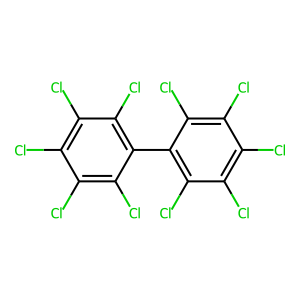

In [4]:
mol = Chem.MolFromSmiles(df_3d_mol['SMILES'][116])
Draw.MolToImage(mol)



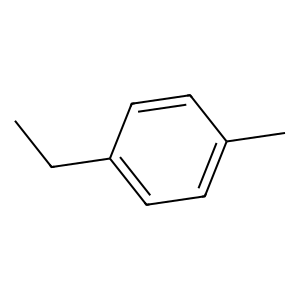

In [5]:
mol = Chem.MolFromSmiles(df_3d_mol['SMILES'][312])
Draw.MolToImage(mol)

In [6]:

print(df_3d_mol.isna().sum())
print(df_3d_mol.isnull().sum())


Compound ID                       0
SMILES                            0
measured log(solubility:mol/L)    0
ABC                               0
ABCGG                             0
                                 ..
WPol                              0
Zagreb1                           0
Zagreb2                           0
mZagreb1                          0
mZagreb2                          0
Length: 1829, dtype: int64
Compound ID                       0
SMILES                            0
measured log(solubility:mol/L)    0
ABC                               0
ABCGG                             0
                                 ..
WPol                              0
Zagreb1                           0
Zagreb2                           0
mZagreb1                          0
mZagreb2                          0
Length: 1829, dtype: int64


In [7]:
column_num = []
column_bool = []
for column in df_3d_mol.columns:
  column_type = df_3d_mol[column].dtype
  if column_type == 'object':
      pass
  elif column_type =='bool':
      column_bool.append(column)
  else:
      column_num.append(column)
data = df_3d_mol[column_num + column_bool]
data.shape
print(f'the value of Filter ItlogS feature is :\n{data['FilterItLogS']} ')
      




the value of Filter ItlogS feature is :
0      -2.790326
1      -2.129911
2      -2.433986
3      -2.147371
4      -2.664600
          ...   
1139   -2.002619
1140   -3.677096
1141   -4.965356
1142   -4.497400
1143   -2.844176
Name: FilterItLogS, Length: 1144, dtype: float64 


**removing the corr columns highly and the leave just the col bool and num**

In [8]:
column_num = []
column_bool = []
for column in df_3d_mol.columns:
  column_type = df_3d_mol[column].dtype
  if column_type == 'object':
      pass
  elif column_type =='bool':
      column_bool.append(column)
  else:
      column_num.append(column)
data = df_3d_mol[column_num + column_bool]
print(data.shape)


(1144, 1287)


In [9]:
data = data[column_num + column_bool]
data.shape


(1144, 1287)

In [10]:
def remove_constant_values(data):
    return [e for e in data.columns if data[e].nunique() == 1]

drop_col = remove_constant_values(data)
#drop_col

new_df_columns = [e for e in data.columns if e not in drop_col]
new_df = data[new_df_columns]
new_df
print(f'the droped column is :{len(drop_col) }')



the droped column is :154


In [11]:
def remove_constant_values(data):
    return [e for e in data.columns if data[e].nunique() == 1]

drop_col = remove_constant_values(data)
#drop_col

new_df_columns = [e for e in data.columns if e not in drop_col]
new_df = data[new_df_columns]
new_df
print(f'the droped column is :{len(drop_col) }')

def correlation(dataset, threshold, protected_cols=['FilterItLogS']):
    col_corr = set() 
    corr_matrix = dataset.corr(numeric_only=True) 
    
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: 
                colname = corr_matrix.columns[i]  
                if colname not in protected_cols:
                    col_corr.add(colname)
                    
    return col_corr
corr_features = correlation(new_df, 0.80)
print("Number of features to drop : ",len(set(corr_features)))


new_df.drop(corr_features, axis=1, inplace=True)
new_df.shape
print(new_df['FilterItLogS'])

the droped column is :154
Number of features to drop :  844
0      -2.790326
1      -2.129911
2      -2.433986
3      -2.147371
4      -2.664600
          ...   
1139   -2.002619
1140   -3.677096
1141   -4.965356
1142   -4.497400
1143   -2.844176
Name: FilterItLogS, Length: 1144, dtype: float64


In [12]:
names = []
for column in new_df.columns:
    names.append(column)
print(names)



['measured log(solubility:mol/L)', 'ABC', 'nBase', 'SpMAD_A', 'VR1_A', 'nAromAtom', 'nSpiro', 'nBridgehead', 'nHetero', 'nN', 'nO', 'nS', 'nP', 'nF', 'nCl', 'nBr', 'nI', 'ATS0Z', 'AATS0dv', 'AATS0Z', 'AATS0se', 'AATS0i', 'ATSC2c', 'ATSC4c', 'ATSC5c', 'ATSC6c', 'ATSC7c', 'ATSC8c', 'ATSC1dv', 'ATSC2dv', 'ATSC3dv', 'ATSC4dv', 'ATSC5dv', 'ATSC6dv', 'ATSC7dv', 'ATSC8dv', 'ATSC2d', 'ATSC3d', 'ATSC4d', 'ATSC5d', 'ATSC6d', 'ATSC7d', 'ATSC8d', 'ATSC1Z', 'ATSC2Z', 'ATSC3Z', 'ATSC4Z', 'ATSC5Z', 'ATSC6Z', 'ATSC7Z', 'ATSC8Z', 'ATSC1v', 'ATSC2v', 'ATSC3v', 'ATSC4v', 'ATSC5v', 'ATSC6v', 'ATSC7v', 'ATSC8v', 'ATSC1se', 'ATSC3se', 'ATSC4se', 'ATSC5se', 'ATSC6se', 'ATSC7se', 'ATSC8se', 'ATSC1p', 'ATSC1i', 'ATSC2i', 'ATSC3i', 'ATSC5i', 'ATSC6i', 'ATSC7i', 'ATSC8i', 'AATSC1d', 'AATSC2Z', 'AATSC0v', 'AATSC0i', 'MATS1c', 'MATS1Z', 'MATS2Z', 'GATS2c', 'GATS1Z', 'GATS2Z', 'GATS2v', 'GATS1se', 'GATS2se', 'GATS2i', 'BCUTc-1l', 'BCUTdv-1l', 'BCUTd-1h', 'BCUTd-1l', 'BCUTZ-1l', 'BalabanJ', 'nBondsD', 'nBondsT', 'FP

In [13]:
new_df.head()

,measured log(solubility:mol/L),ABC,nBase,SpMAD_A,VR1_A,nAromAtom,nSpiro,nBridgehead,nHetero,nN,...,JGI3,JGI4,JGI5,JGI6,JGI7,JGI8,JGI9,JGI10,Lipinski,GhoseFilter
0,-2.18,4.012290,0,0.969771,11.637367,0,0,0,4,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,True,False
1,-2.00,3.464102,0,0.800000,8.000000,0,0,0,3,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,True,False
2,-1.74,3.932653,0,1.000000,11.530010,0,0,0,4,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,True,False
3,-1.48,3.047207,0,1.045250,8.629874,0,0,0,3,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,True,False
4,-3.04,5.808525,0,0.901388,17.881697,0,0,0,6,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,True,False


In [14]:
def convert_bool_to_num(df: pd.DataFrame, bool_cols: list) -> pd.DataFrame:
    df = df.copy()
    for column in df.columns:
        if column in bool_cols:
            df[column] = df[column].astype(int)
    return df

df_new = convert_bool_to_num(new_df, column_bool)
df_new.head()


,measured log(solubility:mol/L),ABC,nBase,SpMAD_A,VR1_A,nAromAtom,nSpiro,nBridgehead,nHetero,nN,...,JGI3,JGI4,JGI5,JGI6,JGI7,JGI8,JGI9,JGI10,Lipinski,GhoseFilter
0,-2.18,4.012290,0,0.969771,11.637367,0,0,0,4,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
1,-2.00,3.464102,0,0.800000,8.000000,0,0,0,3,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
2,-1.74,3.932653,0,1.000000,11.530010,0,0,0,4,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
3,-1.48,3.047207,0,1.045250,8.629874,0,0,0,3,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
4,-3.04,5.808525,0,0.901388,17.881697,0,0,0,6,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0


In [15]:
df_new.to_csv('new_df.csv', index = None)


<Figure size 400x600 with 0 Axes>

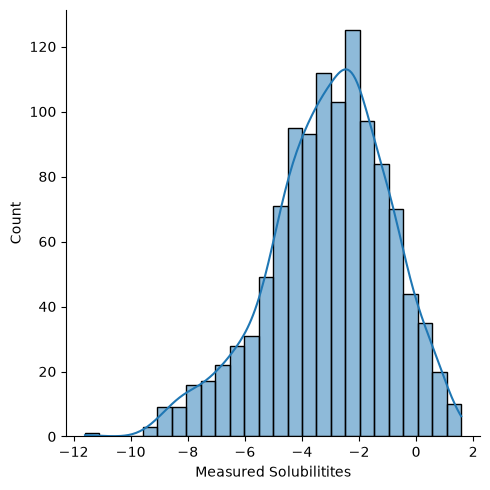

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns 
plt.figure(figsize=(4,6))
sns.displot(data = df_new, x='measured log(solubility:mol/L)', kde=True)

plt.xlabel('Measured Solubilitites');
plt.show()


In [17]:
corr = df_new.corr()
corr

,measured log(solubility:mol/L),ABC,nBase,SpMAD_A,VR1_A,nAromAtom,nSpiro,nBridgehead,nHetero,nN,...,JGI3,JGI4,JGI5,JGI6,JGI7,JGI8,JGI9,JGI10,Lipinski,GhoseFilter
measured log(solubility:mol/L),1.000000,-0.587292,0.027608,-0.400888,-0.042746,-0.504614,0.009736,-0.095359,-0.179433,0.066841,...,-0.144504,-0.166640,-0.242768,-0.407580,-0.352430,-0.381077,-0.296588,-0.284985,0.536947,-0.319041
ABC,-0.587292,1.000000,0.015239,0.518070,0.269720,0.478733,0.047461,0.103426,0.622045,0.256624,...,0.371893,0.252384,0.438656,0.603095,0.630818,0.649665,0.604904,0.568986,-0.403142,0.580382
nBase,0.027608,0.015239,1.000000,0.002966,-0.005712,-0.018025,-0.010397,-0.014341,0.080058,0.243297,...,0.048381,0.049684,0.024186,-0.015920,0.062689,-0.005405,0.010733,-0.017339,0.041217,0.010238
SpMAD_A,-0.400888,0.518070,0.002966,1.000000,0.034976,0.613300,0.023255,0.063530,0.072628,0.132353,...,0.158292,0.406323,0.292834,0.363907,0.247982,0.284155,0.210123,0.173100,-0.200843,0.307161
VR1_A,-0.042746,0.269720,-0.005712,0.034976,1.000000,-0.030181,-0.003541,-0.004722,0.159333,-0.024607,...,0.025229,0.017358,0.016255,0.053924,0.047015,0.063713,0.073997,0.094727,-0.136917,-0.029163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
JGI8,-0.381077,0.649665,-0.005405,0.284155,0.063713,0.272938,0.016945,-0.035987,0.423663,0.152328,...,0.148927,0.083582,0.259373,0.541474,0.616922,1.000000,0.552580,0.429913,-0.210515,0.521385
JGI9,-0.296588,0.604904,0.010733,0.210123,0.073997,0.184072,0.008003,-0.050169,0.353518,0.071457,...,0.135920,0.046194,0.178560,0.378284,0.475748,0.552580,1.000000,0.553025,-0.193187,0.394118
JGI10,-0.284985,0.568986,-0.017339,0.173100,0.094727,0.141234,-0.012563,-0.037981,0.300058,0.040651,...,0.107922,0.029615,0.136373,0.266449,0.344662,0.429913,0.553025,1.000000,-0.156746,0.318947
Lipinski,0.536947,-0.403142,0.041217,-0.200843,-0.136917,-0.333948,0.027918,-0.102014,-0.193421,0.174111,...,-0.071523,-0.043597,-0.062052,-0.221331,-0.170497,-0.210515,-0.193187,-0.156746,1.000000,0.082633


In [18]:
corr = df_new.corr()
print(corr)
corr.style.background_gradient(cmap='coolwarm', axis=None)
corr_sorted = abs(corr[['measured log(solubility:mol/L)']]).sort_values(by ='measured log(solubility:mol/L)', ascending=False)
corr.style.background_gradient(cmap='coolwarm', axis=None)





                                measured log(solubility:mol/L)       ABC  \
measured log(solubility:mol/L)                        1.000000 -0.587292   
ABC                                                  -0.587292  1.000000   
nBase                                                 0.027608  0.015239   
SpMAD_A                                              -0.400888  0.518070   
VR1_A                                                -0.042746  0.269720   
...                                                        ...       ...   
JGI8                                                 -0.381077  0.649665   
JGI9                                                 -0.296588  0.604904   
JGI10                                                -0.284985  0.568986   
Lipinski                                              0.536947 -0.403142   
GhoseFilter                                          -0.319041  0.580382   

                                   nBase   SpMAD_A     VR1_A  nAromAtom  \
measured log

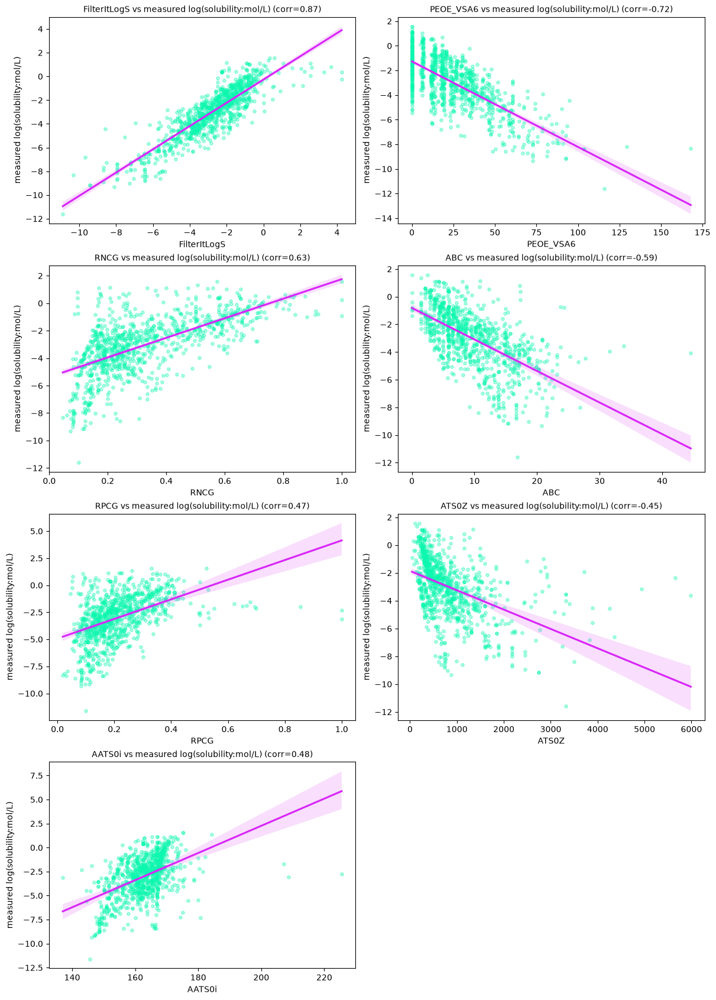

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

EDA_SAMPLE = 1000

NUMERICAL_COL = [
    'FilterItLogS', 'PEOE_VSA6', 'RNCG', 'ABC', 'RPCG', 'ATS0Z', 'AATS0i'
    

]

eda_sample = df_new.sample(min(len(df_new), EDA_SAMPLE), random_state=SEED)

n_cols = 2
n_rows = int(np.ceil(len(NUMERICAL_COL) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4.2 * n_rows), constrained_layout=True)
axes = axes.flatten()

for i, col in enumerate(NUMERICAL_COL):
    sns.regplot(
        data=eda_sample, x=col, y=TARGET_COL,
        scatter_kws={'alpha': 0.35, 's': 15, 'color': "#0CF7AF"},
        line_kws={'color': "#D826F8"},
        ax=axes[i]
    )
    corr_val = eda_sample[[col, TARGET_COL]].corr().iloc[0, 1]
    axes[i].set_title(f'{col} vs {TARGET_COL} (corr={corr_val:.2f})', fontsize=10)

for j in range(len(NUMERICAL_COL), len(axes)):
    axes[j].axis('off')

plt.show()


In [20]:

corr_sorted = corr_sorted.iloc[1:5, :]
corr_sorted.rename(columns={'measured log(solubility:mol/L)' : 'correlation_coef'}, inplace=True)



Text(0, 0.5, 'Correlation Coefficient')

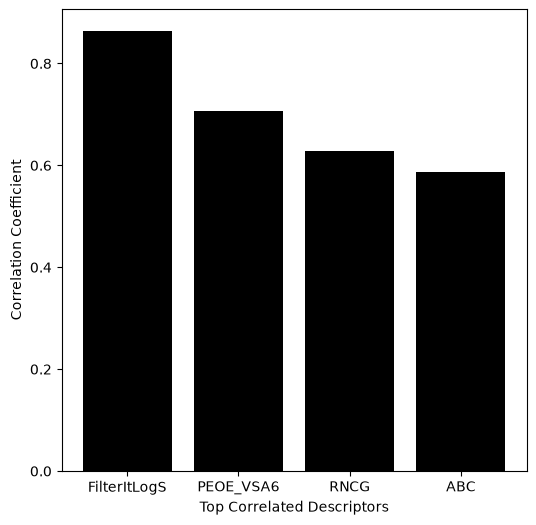

In [21]:
fig = plt.figure(1, figsize=(6,6))
ax1 = fig.add_subplot(111)
plt.bar(x = corr_sorted.index, height = corr_sorted['correlation_coef'], color = 'black')
ax1.set_xlabel('Top Correlated Descriptors')
ax1.set_ylabel('Correlation Coefficient')

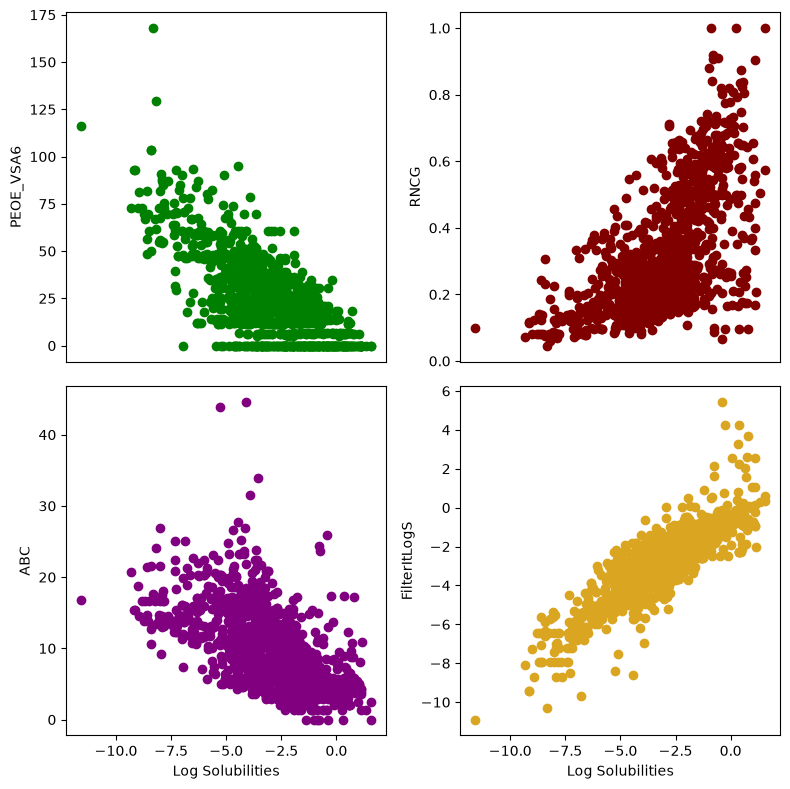

In [22]:
plt.figure(figsize=(8,8))
paleete = ['green', 'maroon', 'purple', 'goldenrod']
for index, col in enumerate(['PEOE_VSA6', 'RNCG', 'ABC' , 'FilterItLogS']):
  plt.subplot(2,2,index+1)
  plt.scatter(x = df_new['measured log(solubility:mol/L)'], y = df_new[col], color = paleete[index])
  plt.ylabel(col)
  plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
  if index>=2:
    plt.tick_params(axis='x', which='both', bottom=True, labelbottom=True)
    plt.xlabel('Log Solubilities')

plt.tight_layout()


In [23]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

from sklearn.model_selection import train_test_split, KFold
y = df_new[TARGET_COL]
X_raw = df_new.iloc[: , 1: ]
X_raw.head()

      

,ABC,nBase,SpMAD_A,VR1_A,nAromAtom,nSpiro,nBridgehead,nHetero,nN,nO,...,JGI3,JGI4,JGI5,JGI6,JGI7,JGI8,JGI9,JGI10,Lipinski,GhoseFilter
0,4.012290,0,0.969771,11.637367,0,0,0,4,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
1,3.464102,0,0.800000,8.000000,0,0,0,3,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
2,3.932653,0,1.000000,11.530010,0,0,0,4,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
3,3.047207,0,1.045250,8.629874,0,0,0,3,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
4,5.808525,0,0.901388,17.881697,0,0,0,6,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0


In [24]:


# CORRIGE : split train/test AVANT le scaling, pour eviter la fuite de donnees
X_train_raw, X_test_raw, y_train, y_test = train_test_split(
    X_raw, y, test_size=0.2, random_state=SEED
)

scaler = StandardScaler()
X_train = pd.DataFrame(
    scaler.fit_transform(X_train_raw), columns=X_train_raw.columns, index=X_train_raw.index
)
X_test = pd.DataFrame(
    scaler.transform(X_test_raw), columns=X_test_raw.columns, index=X_test_raw.index
)

print(X_train.shape)
print(X_test.shape)
print(X_test.head())

(915, 288)
(229, 288)
          ABC     nBase   SpMAD_A     VR1_A  nAromAtom    nSpiro  nBridgehead  \
218 -0.968373 -0.122105 -0.868141 -0.057985  -0.984574 -0.074125    -0.121604   
809  1.029876 -0.122105  0.344074 -0.043488   1.364030 -0.074125    -0.121604   
501  1.186159 -0.122105  0.143553 -0.042365   1.364030 -0.074125    -0.121604   
649  0.834487 -0.122105 -0.162415 -0.043042   0.189728 -0.074125    -0.121604   
323 -0.259867 -0.122105  1.023978 -0.055080   0.972596 -0.074125    -0.121604   

      nHetero        nN        nO  ...      JGI3      JGI4      JGI5  \
218 -0.854212 -0.661537 -0.313439  ...  0.464579  0.325190 -1.161642   
809  0.544632 -0.661537  0.200533  ...  0.464579  0.096203  0.080351   
501  0.544632 -0.661537  0.714506  ...  0.723898 -0.204025  0.297626   
649  0.894343 -0.661537  1.742450  ...  1.412436  0.235709  0.478941   
323  0.194921  2.395566 -0.827411  ... -0.157788  0.162355 -0.051776   

         JGI6      JGI7      JGI8      JGI9     JGI10  Lip

In [40]:
import joblib
joblib.dump(scaler, 'scaler.pkl')

['scaler.pkl']

In [25]:
N_SPLITS = 4
N_JOBS = -1
N_TRIALS = 20
from xgboost import XGBRegressor
import optuna
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

kf = KFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)

def xgb_objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 200, 500, step=100),
        'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 6),
        'reg_lambda': trial.suggest_float('reg_lambda', 1, 10),
        'random_state': SEED,
        'n_jobs': N_JOBS,
    }
    scores = []

    for train_idx, val_idx in kf.split(X_train, y_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        model = XGBRegressor(**params)
        model.fit(X_tr, y_tr)
        preds = model.predict(X_val)
        scores.append(mean_absolute_error(y_val, preds))
    return np.mean(scores)

print('Optimisation XGB...')
study_xgb = optuna.create_study(direction='minimize')
study_xgb.optimize(xgb_objective, n_trials=N_TRIALS)
print('Best XGB MAE (CV):', study_xgb.best_value, '| params:', study_xgb.best_params)



[I 2026-09-17 20:56:38,854] A new study created in memory with name: no-name-33164cab-39f7-4312-a874-fea3e7c125f5


Optimisation XGB...


[I 2026-09-17 20:57:18,497] Trial 0 finished with value: 0.5129881143176047 and parameters: {'n_estimators': 300, 'learning_rate': 0.06737543310467582, 'max_depth': 6, 'reg_lambda': 2.2915940236470007}. Best is trial 0 with value: 0.5129881143176047.
[I 2026-09-17 20:57:41,669] Trial 1 finished with value: 0.5137273972824283 and parameters: {'n_estimators': 400, 'learning_rate': 0.03310489380228233, 'max_depth': 4, 'reg_lambda': 2.8744218145779823}. Best is trial 0 with value: 0.5129881143176047.
[I 2026-09-17 20:58:20,989] Trial 2 finished with value: 0.5106554615007329 and parameters: {'n_estimators': 500, 'learning_rate': 0.0693735275858628, 'max_depth': 5, 'reg_lambda': 9.384746062003085}. Best is trial 2 with value: 0.5106554615007329.
[I 2026-09-17 20:59:06,408] Trial 3 finished with value: 0.5172343887796033 and parameters: {'n_estimators': 400, 'learning_rate': 0.07081894176266378, 'max_depth': 6, 'reg_lambda': 8.37405277269115}. Best is trial 2 with value: 0.5106554615007329.


Best XGB MAE (CV): 0.4949466415082372 | params: {'n_estimators': 300, 'learning_rate': 0.09835850761891098, 'max_depth': 4, 'reg_lambda': 7.317367194749584}


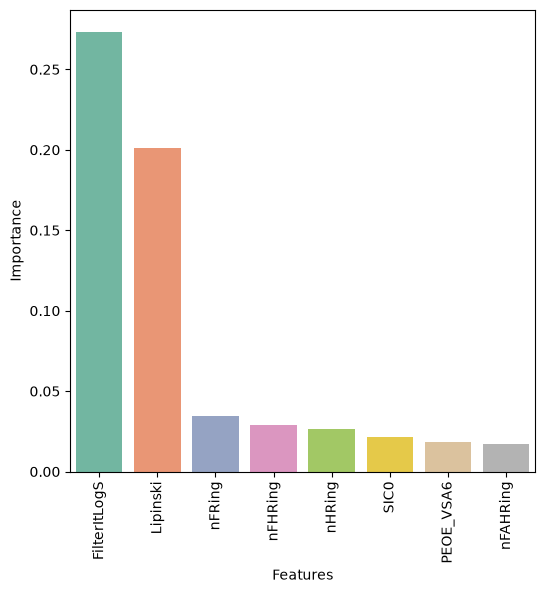

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from xgboost import XGBRegressor

# 1. Define l-data (X w y)
X = df_new.iloc[:, 1:]
y = df_new[TARGET_COL]  # Badal 'target' b-smyt l-column dyal-ak

# 2. Instanciate l-model
model = XGBRegressor(**study_xgb.best_params, random_state=SEED, n_jobs=N_JOBS, tree_method='hist')

# 3. FIT L-MODEL (Hadi hiya li kants naqṣa!)
model.fit(X_train,y_train  )

# 4. Get feature importances
importance = model.feature_importances_

# 5. Summarize feature importance
DF_imp = pd.DataFrame({
    'Features': X.columns,
    'Importance': importance
}).sort_values('Importance', ascending=False)

DF_imp.to_excel('imp.xlsx', index=None)

# 6. Plot top 8 features
top_desc_fi = DF_imp.head(8)
plt.figure(figsize=(6, 6))
sns.barplot(data=top_desc_fi, x='Features', y='Importance', palette='Set2')
plt.xticks(rotation=90)
plt.show()


In [27]:
def evaluate_all_metrics(y_true, y_pred):
    return {

        'R2': r2_score(y_true, y_pred),
    }


model.fit(X_train, y_train)
y_preds = model.predict(X_test)

scores = evaluate_all_metrics(y_test, y_preds)
print(f"\n--- {model} ---")
for metric_name, value in scores.items():
    print(f"{metric_name}: {value:.4f}")


--- XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=True, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.09835850761891098, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=300, n_jobs=-1,
             num_parallel_tree=None, ...) ---
R2: 0.9049


In [28]:
from lightgbm import LGBMRegressor

def objective_lgb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 200, 500, step=100),
        'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 6),
        'reg_lambda': trial.suggest_float('reg_lambda', 1, 10),
        'random_state': SEED,
        'verbose': -1,
        'n_jobs': N_JOBS,
    }
    scores = []
    for train_idx, val_idx in kf.split(X_train, y_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
        
        model = LGBMRegressor(**params)
        model.fit(X_tr, y_tr)
        preds = model.predict(X_val)
        scores.append(mean_absolute_error(y_val, preds))
    return np.mean(scores)
print('Optimisation LGB...')
study_lgb = optuna.create_study(direction='minimize')
study_lgb.optimize(objective_lgb, n_trials=N_TRIALS)
print('Best LGB MAE (CV):', study_lgb.best_value, '| params:', study_lgb.best_params)





[I 2026-09-17 21:05:27,803] A new study created in memory with name: no-name-1ad9c9c3-0b3d-4b77-b738-772f7402ea37


Optimisation LGB...


[I 2026-09-17 21:05:32,722] Trial 0 finished with value: 0.4964283727266887 and parameters: {'n_estimators': 400, 'learning_rate': 0.05234548576870267, 'max_depth': 4, 'reg_lambda': 6.608581442135311}. Best is trial 0 with value: 0.4964283727266887.
[I 2026-09-17 21:05:35,702] Trial 1 finished with value: 0.5158167820601567 and parameters: {'n_estimators': 200, 'learning_rate': 0.04497258240662286, 'max_depth': 4, 'reg_lambda': 5.314099025565309}. Best is trial 0 with value: 0.4964283727266887.
[I 2026-09-17 21:05:42,643] Trial 2 finished with value: 0.5043409133530163 and parameters: {'n_estimators': 300, 'learning_rate': 0.07719076528529273, 'max_depth': 5, 'reg_lambda': 3.4297731694067517}. Best is trial 0 with value: 0.4964283727266887.
[I 2026-09-17 21:05:47,518] Trial 3 finished with value: 0.5045745725851318 and parameters: {'n_estimators': 200, 'learning_rate': 0.07302568968924898, 'max_depth': 5, 'reg_lambda': 8.51753864555157}. Best is trial 0 with value: 0.4964283727266887.


Best LGB MAE (CV): 0.49500089787666546 | params: {'n_estimators': 300, 'learning_rate': 0.09918953707265842, 'max_depth': 4, 'reg_lambda': 4.58990672414857}


In [29]:
from catboost import CatBoostRegressor
def objective_cat(trial) : 
    params = {
        'iterations': trial.suggest_int('iterations', 200, 500, step=100),
        'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.1, log=True),
        'depth': trial.suggest_int('depth', 3, 6),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'random_state': SEED,
        'silent': True,
        'thread_count': N_JOBS,
    }
    scores = []
    for train_idx , val_idx in kf.split(X_train , y_train) : 
        X_tr , X_val = X_train.iloc[train_idx] , X_train.iloc[val_idx]
        y_tr , y_val = y_train.iloc[train_idx] , y_train.iloc[val_idx]
        model = CatBoostRegressor(**params)
        model.fit(X_tr , y_tr)
        preds = model.predict(X_val)
        scores.append(mean_absolute_error(y_val , preds))
    return np.mean(scores)
print('Optimisation cat...')
study_cat = optuna.create_study(direction='minimize')
study_cat.optimize(objective_cat, n_trials=N_TRIALS)
print('Best cat MAE (CV):', study_cat.best_value, '| params:', study_cat.best_params)




[I 2026-09-17 21:07:05,746] A new study created in memory with name: no-name-93c0505d-ea26-4427-911a-50fe1f9ed55c


Optimisation cat...


[I 2026-09-17 21:07:54,205] Trial 0 finished with value: 0.47666841802844595 and parameters: {'iterations': 300, 'learning_rate': 0.07865112380833186, 'depth': 6, 'l2_leaf_reg': 5.015885748571695}. Best is trial 0 with value: 0.47666841802844595.
[I 2026-09-17 21:08:09,088] Trial 1 finished with value: 0.532357480686203 and parameters: {'iterations': 200, 'learning_rate': 0.06944932599491938, 'depth': 4, 'l2_leaf_reg': 6.5369511777471185}. Best is trial 0 with value: 0.47666841802844595.
[I 2026-09-17 21:08:27,085] Trial 2 finished with value: 0.48813303772850447 and parameters: {'iterations': 300, 'learning_rate': 0.0844188747429616, 'depth': 4, 'l2_leaf_reg': 4.077551552307457}. Best is trial 0 with value: 0.47666841802844595.
[I 2026-09-17 21:08:56,275] Trial 3 finished with value: 0.4722245189616082 and parameters: {'iterations': 500, 'learning_rate': 0.09532253596640151, 'depth': 4, 'l2_leaf_reg': 4.539681257794911}. Best is trial 3 with value: 0.4722245189616082.
[I 2026-09-17 21

Best cat MAE (CV): 0.4662471243252608 | params: {'iterations': 500, 'learning_rate': 0.08846929319677863, 'depth': 5, 'l2_leaf_reg': 3.9947817651907256}


In [30]:
models = {
    'XGBoost': XGBRegressor(**study_xgb.best_params, random_state=SEED,n_jobs=N_JOBS, tree_method='hist'),
    'LightGBM': LGBMRegressor(**study_lgb.best_params, random_state=SEED, verbose=-1, n_jobs=N_JOBS),
    'CatBoost': CatBoostRegressor(**study_cat.best_params, random_state=SEED, silent=True, thread_count=N_JOBS)
    }
def evaluate_all_metrics(y_true, y_pred):
    return {
        'R2': r2_score(y_true, y_pred),
    }
for name, model in models.items():
    model.fit(X_train, y_train)
    y_preds = model.predict(X_test)

    scores = evaluate_all_metrics(y_test, y_preds)
    print(f"\n--- {name} ---")
    for metric_name, value in scores.items():
        print(f"{metric_name}: {value:.4f}")
    


--- XGBoost ---
R2: 0.9049

--- LightGBM ---
R2: 0.9173

--- CatBoost ---
R2: 0.9241


Training and evaluating: XGBoost...


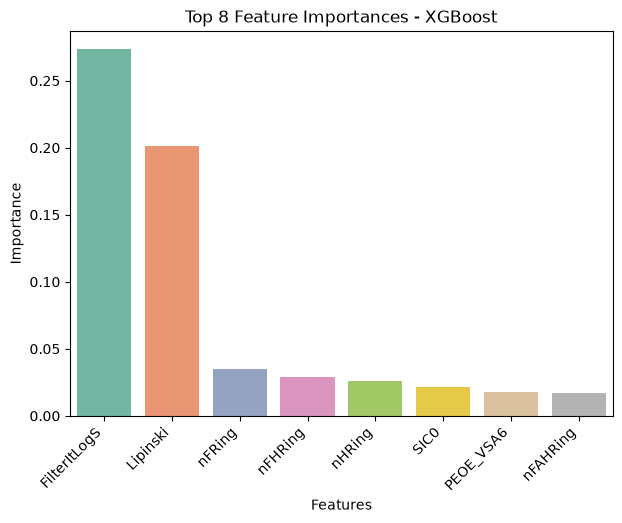

Training and evaluating: LightGBM...


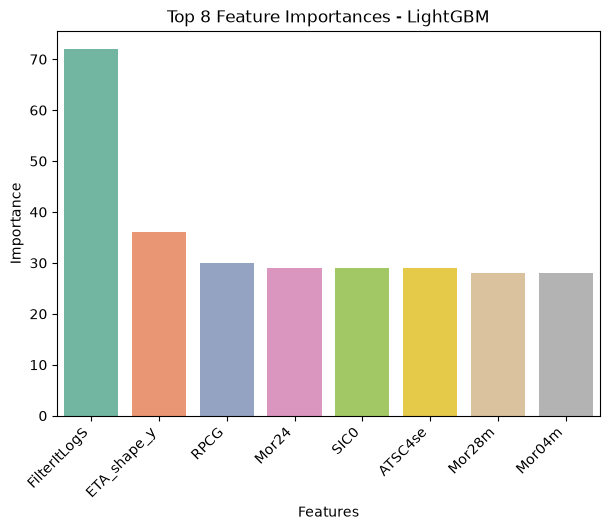

Training and evaluating: CatBoost...


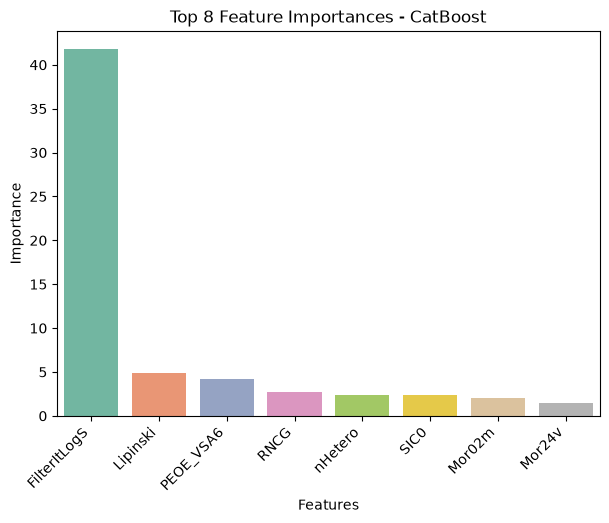

In [31]:

all_importances = {}


for name, model in models.items():
    print(f"Training and evaluating: {name}...")
    
    
    model.fit(X_train, y_train)
   
    importance = model.feature_importances_
    
   
    df_imp = pd.DataFrame({
        'Features': X_train.columns,
        'Importance': importance
    }).sort_values('Importance', ascending=False)
    
    
    df_imp.to_excel(f'imp_{name}.xlsx', index=None)
    all_importances[name] = df_imp
    
    
    top_8 = df_imp.head(8)
    plt.figure(figsize=(7, 5))
    sns.barplot(data=top_8, x='Features', y='Importance', palette='Set2')
    plt.title(f'Top 8 Feature Importances - {name}')
    plt.xticks(rotation=45, ha='right')
    
    
    
    plt.show()
    plt.close()

    

**predictions**

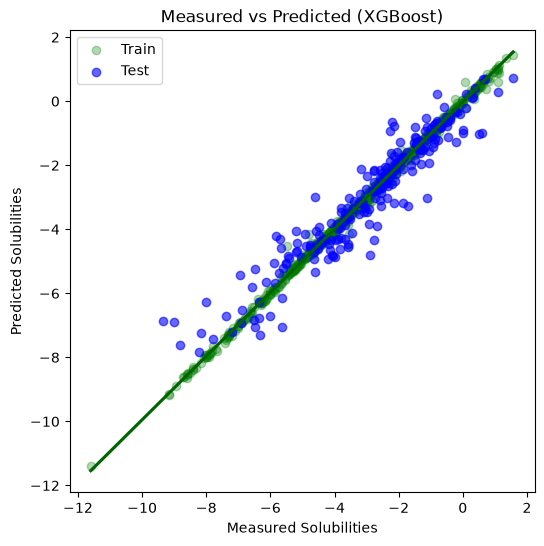

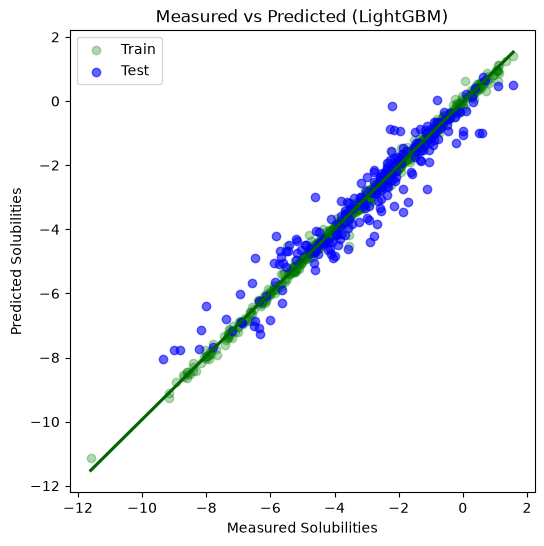

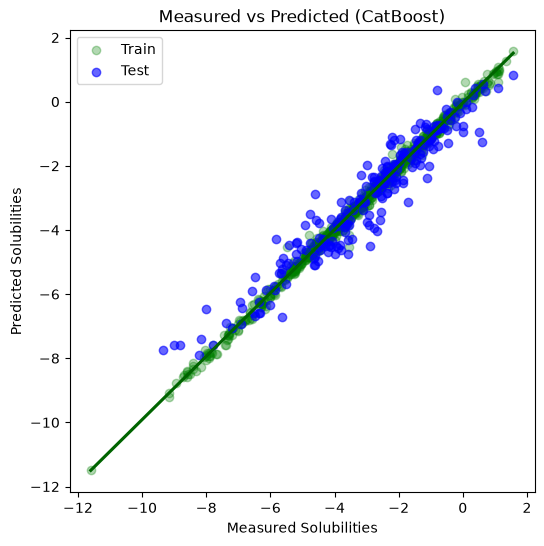

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

for name, model in models.items():
    plt.figure(figsize=(6, 6))
    
    # Train predictions (Green)
    sns.regplot(
        x=y_train, 
        y=model.predict(X_train), 
        color='green', 
        scatter_kws={'alpha': 0.3}, 
        line_kws={'color': 'darkgreen'},
        label='Train'
    )
    
    # Test predictions (Blue)
    plt.scatter(
        y_test, 
        model.predict(X_test), 
        color='blue', 
        alpha=0.6, 
        label='Test'
    )
    
    plt.xlabel('Measured Solubilities')
    plt.ylabel('Predicted Solubilities')
    plt.title(f'Measured vs Predicted ({name})')
    plt.legend()
    
    plt.show()
    plt.close()

**load all the models**

In [36]:
import joblib

for name, model in models.items():
    joblib.dump(model, f'{name}_model.pkl')
    print(f'Saved: {name}_model.pkl')


loaded_models = {}
for name in ['XGBoost', 'LightGBM', 'CatBoost']:
    loaded_models[name] = joblib.load(f'{name}_model.pkl')
    print(f'Loaded: {name}')

Saved: XGBoost_model.pkl
Saved: LightGBM_model.pkl
Saved: CatBoost_model.pkl
Loaded: XGBoost
Loaded: LightGBM
Loaded: CatBoost


**prediction starting from smile**

In [37]:

def _build_mol(smile: str):
    mol = Chem.MolFromSmiles(smile)
    if mol is None:
        print(f"[WARN] Invalid SMILES, skipped: {smile}")
        return None

    mol = Chem.AddHs(mol)
    embed_status = AllChem.EmbedMolecule(mol, randomSeed=42)
    if embed_status != 0:
        embed_status = AllChem.EmbedMolecule(mol, randomSeed=42, useRandomCoords=True)
    if embed_status != 0:
        print(f"[WARN] 3D embedding failed, skipped: {smile}")
        return None

    return mol

In [ ]:
import pandas as pd
import numpy as np

def predict_sol_smiles(smiles):

    if isinstance(smiles, str):
        smiles = [smiles]

    valid_smiles = []
    mols = []
    for smile in smiles:
        mol = _build_mol(smile)
        if mol is not None:
            valid_smiles.append(smile)
            mols.append(mol)

    if not mols:
        print("[ERROR] No valid molecules to predict on.")
        return pd.DataFrame(columns=['SMILES'])

    calc = Calculator(descriptors, ignore_3D=False)
    desc = calc.pandas(mols)

    desc_all = desc.apply(pd.to_numeric, errors='coerce')


    if desc_all.isna().any().any():
        n_bad = int(desc_all.isna().sum().sum())
        print(f"[WARN] {n_bad} descriptor value(s) could not be computed, filled with column mean.")
        desc_all = desc_all.fillna(desc_all.mean()).fillna(0)

    X_new = scaler.transform(desc_all)


    results_df = pd.DataFrame({'SMILES': valid_smiles})

    for name, model in models.items():
        predicted_logS = model.predict(X_new)
        results_df[f'logS_{name}'] = predicted_logS
        results_df[f'Solubility_mol_L_{name}'] = 10 ** predicted_logS

    sol_cols = [c for c in results_df.columns if c.startswith('Solubility_mol_L_')]
    results_df['Ensemble_Solubility_mol_L'] = results_df[sol_cols].mean(axis=1)

    return results_df